# Module 4: Measuring plant phenotypes with PlantCV - Single plant

[PlantCV homepage](https://plantcv.danforthcenter.org/)

[PlantCV documentation](https://plantcv.readthedocs.io/en/stable/)

In [1]:
%matplotlib widget
import matplotlib
from plantcv import plantcv as pcv
import numpy as np
import cv2

In [2]:
matplotlib.rcParams["figure.max_open_warning"] = False
pcv.params.debug = "plot"
pcv.params.text_size = 10
pcv.params.text_thickness = 10
pcv.params.line_thickness = 10

In [3]:
pcv.__version__

'3.13.4+271.g0e11c7f6'

 ## Refresher: plant segmentation

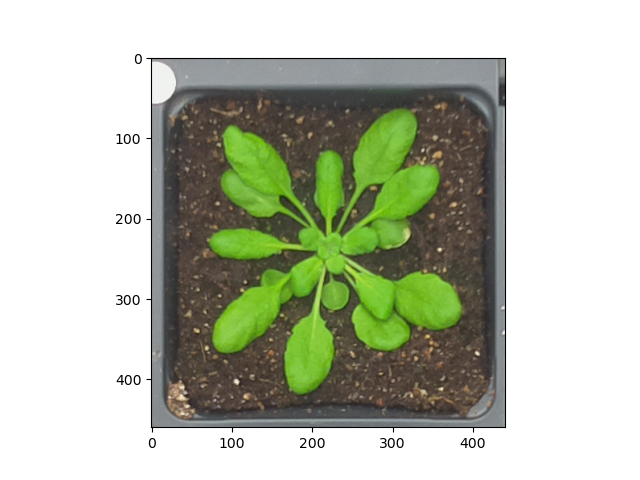

In [4]:
# Open image file
img, imgpath, imgname = pcv.readimage(filename="images/cropped_plant.png")

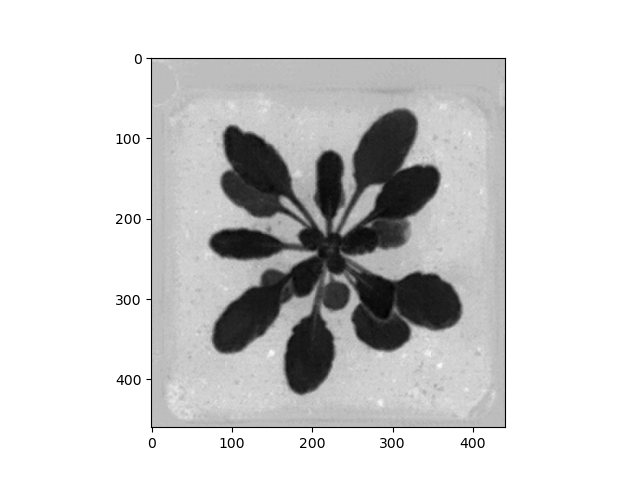

In [5]:
# Convert the RGB image into a grayscale image by choosing one of the HSV or LAB channels
gray_img = pcv.rgb2gray_lab(rgb_img=img, channel="a")

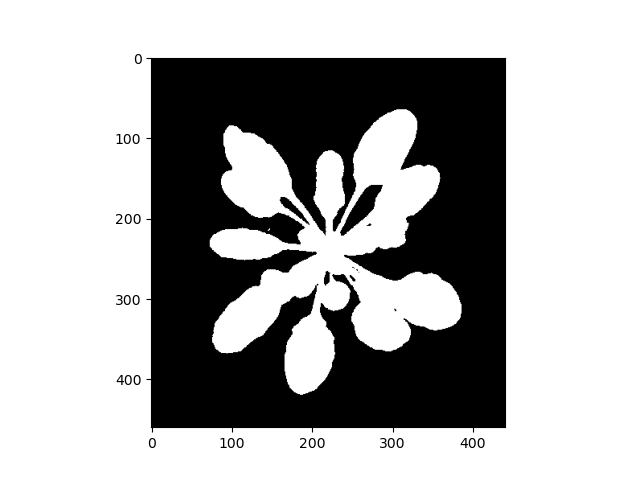

In [6]:
# Instead of setting a manual threshold, try an automatic threshold method such as Otsu
bin_img = pcv.threshold.otsu(gray_img=gray_img, max_value=255, object_type="dark")

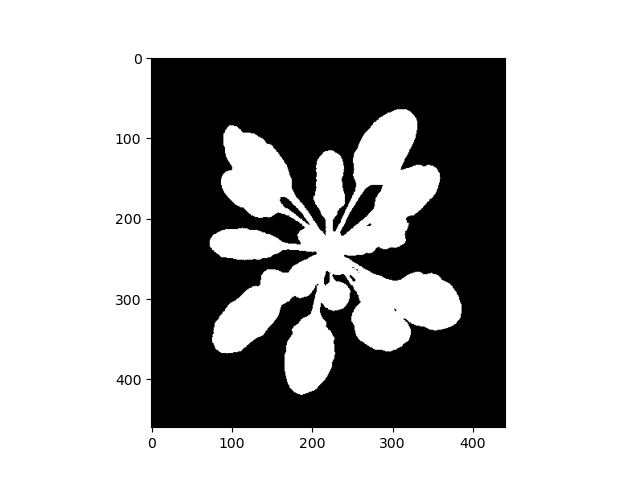

In [7]:
# Remove "salt" noise from the binary image
filter_bin = pcv.fill(bin_img=bin_img, size=100)

## Measuring the shape and color of objects in digital image

At this stage we have a binary mask that labels plant pixels (white) and background pixels (black). What can this tell us (and not tell us) about the plant?

In [8]:
# What is the size of the image?
filter_bin.size

202400

In [9]:
# What is the total area of the plant?
np.count_nonzero(filter_bin)

51780

In [10]:
# What is the proportion of the image the plant occupies?
np.count_nonzero(filter_bin) / filter_bin.size

0.2558300395256917

There are properties of the shape of the plant that the binary mask cannot be used to measure directly

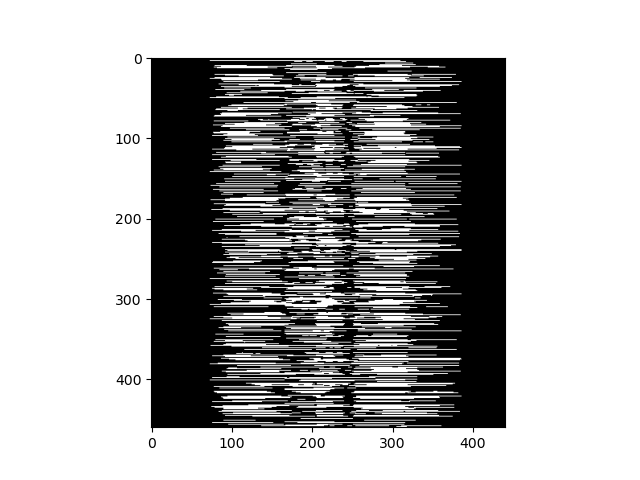

In [11]:
# Shuffle the binary mask values
shuf_bin = filter_bin.copy()
np.random.shuffle(shuf_bin)
pcv.plot_image(shuf_bin)

In [12]:
# What is the size of the plant if we do the same measurements again?
print(shuf_bin.size)
print(np.count_nonzero(shuf_bin))
print(np.count_nonzero(shuf_bin) / shuf_bin.size)

202400
51780
0.2558300395256917


What does this mean?

While the binary mask can give us information about the size of the plant, it does not contain information about the shape or layout of the plant.

Instead we can convert the binary mask into polygons that allow us to measure shapes. OpenCV contours: https://docs.opencv.org/4.5.5/dd/d49/tutorial_py_contour_features.html

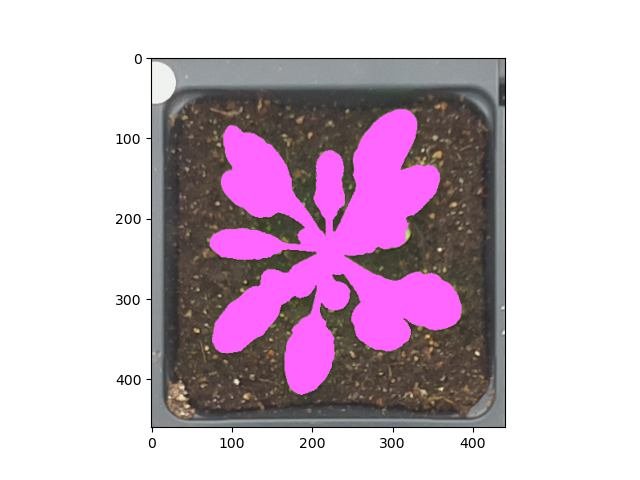

In [13]:
# Identify connected components (contours) using the binary image
cnt, cnt_str = pcv.find_objects(img=img, mask=filter_bin)

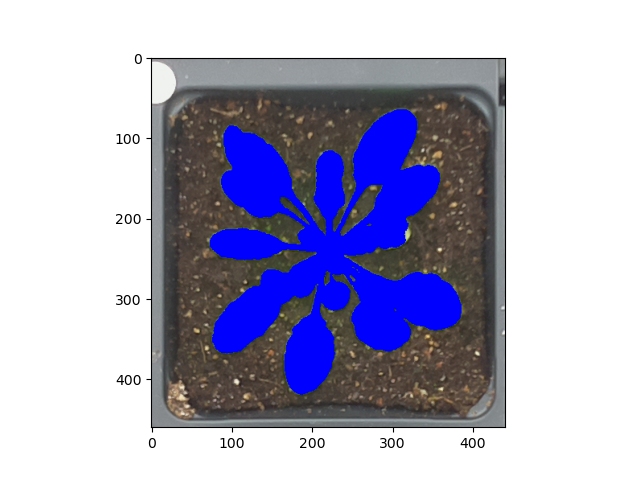

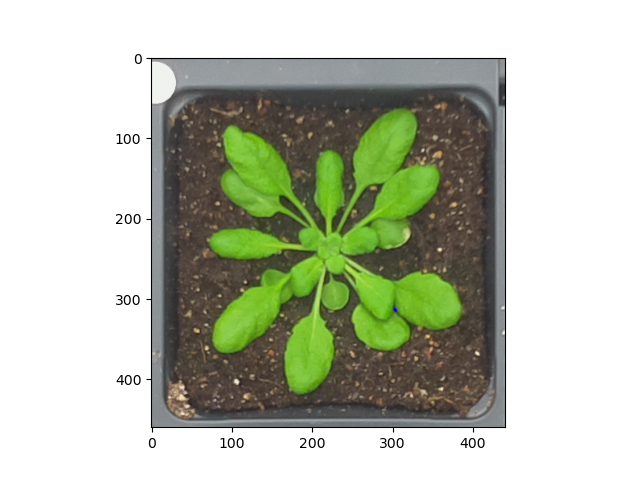

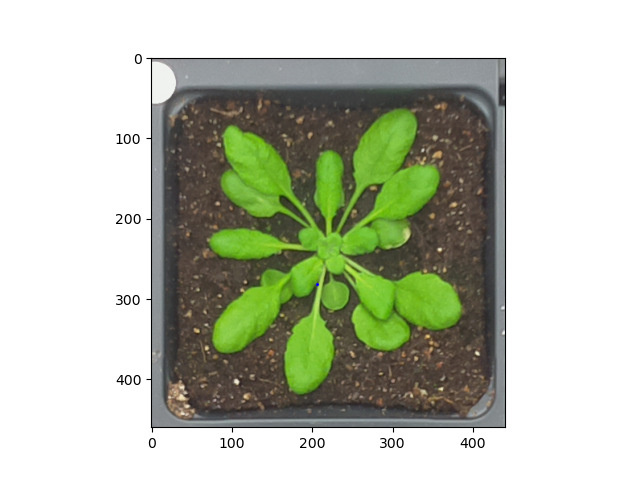

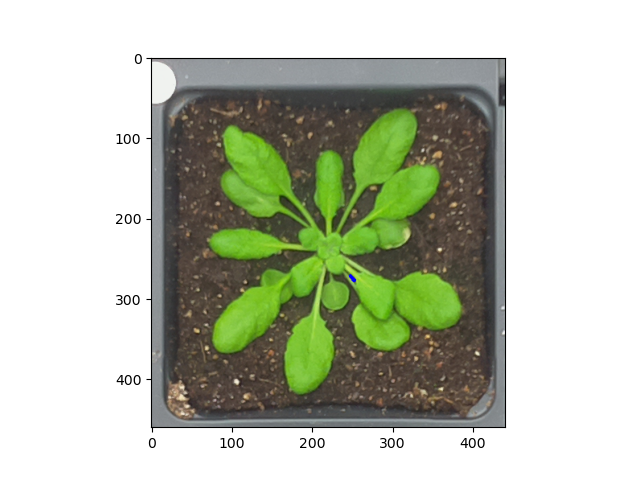

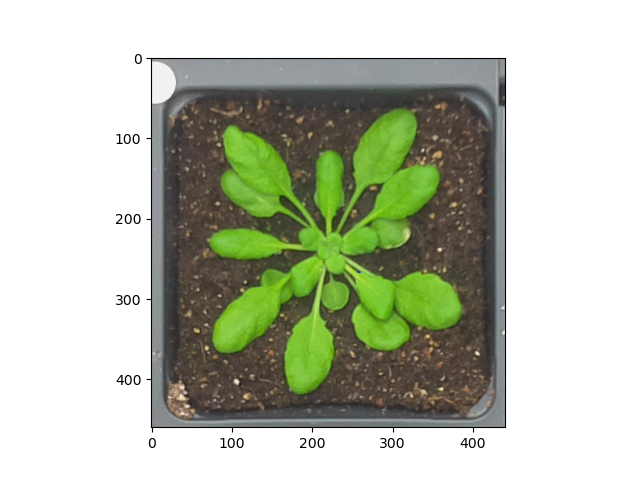

...

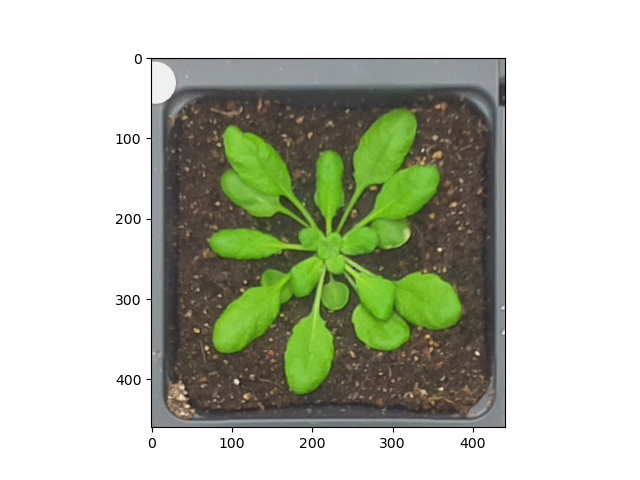

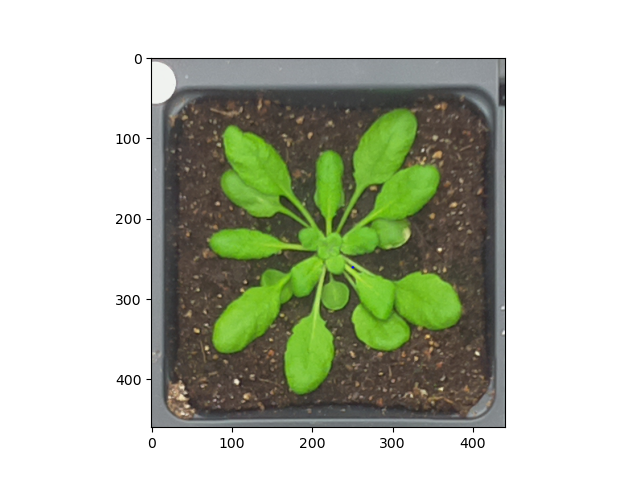

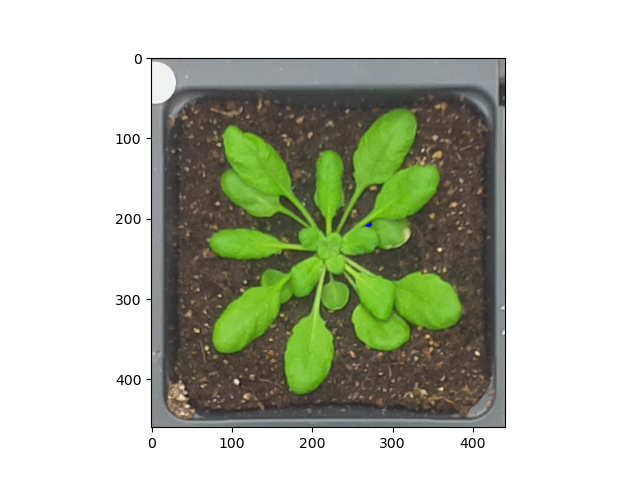

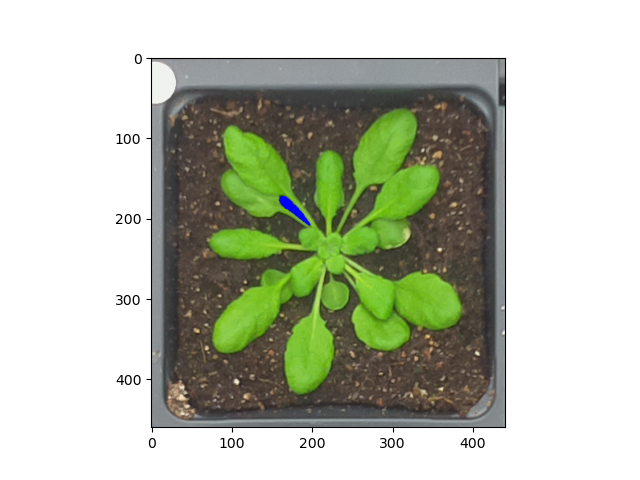

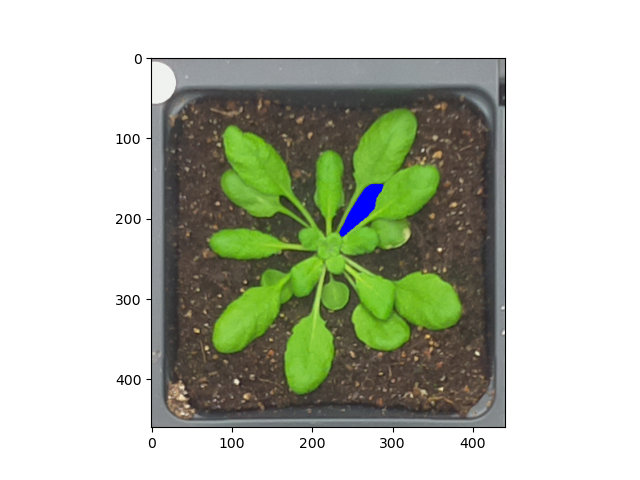

In [14]:
# Plot each contour to see where they are
pcv.params.color_sequence = "random"
cp = img.copy()
for i in range(0, len(cnt)):
    cv2.drawContours(cp, cnt, i, pcv.color_palette(num=100, saved=False)[0], thickness=-1, hierarchy=cnt_str)
pcv.plot_image(cp)

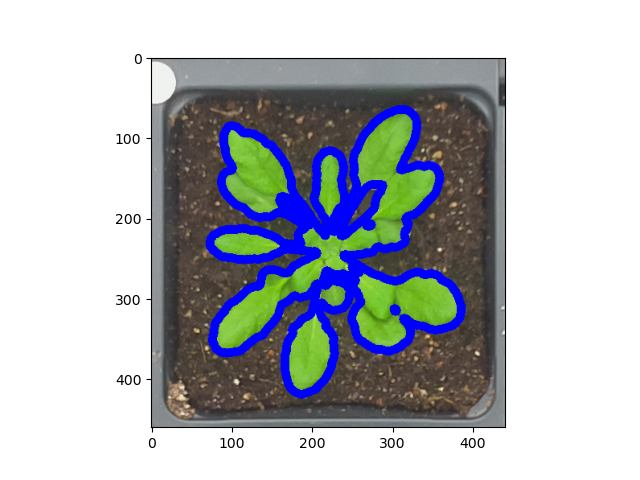

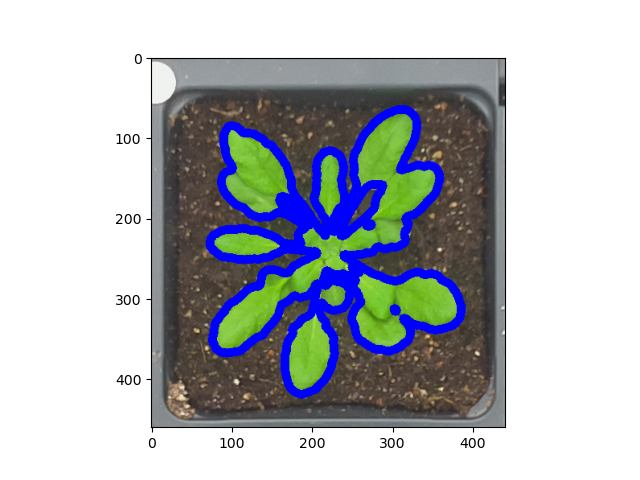

In [15]:
# Flatten contours into a single object
# Combine the contours into a single plant object
plant, mask = pcv.object_composition(img=img, contours=cnt, hierarchy=cnt_str)

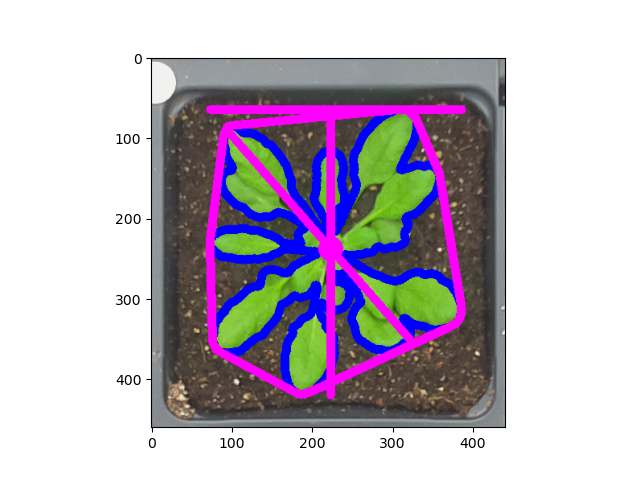

In [16]:
# Measure the size and shape of the plant
shape_img = pcv.analyze_object(img=img, obj=plant, mask=mask)

In [17]:
# Output measurements
print(f"Leaf area = {pcv.outputs.observations['default']['area']['value']} pixels")
print(f"Convex hull area = {pcv.outputs.observations['default']['convex_hull_area']['value']} pixels")
print(f"Solidity = {pcv.outputs.observations['default']['solidity']['value']}")
print(f"Perimeter = {pcv.outputs.observations['default']['perimeter']['value']} pixels")
print(f"Width = {pcv.outputs.observations['default']['width']['value']} pixels")
print(f"Height = {pcv.outputs.observations['default']['height']['value']} pixels")
print(f"Center of mass = {pcv.outputs.observations['default']['center_of_mass']['value']}")
print(f"Convex hull vertices = {pcv.outputs.observations['default']['convex_hull_vertices']['value']}")
print(f"Plant in frame = {pcv.outputs.observations['default']['object_in_frame']['value']}")
print(f"Bounding ellipse center = {pcv.outputs.observations['default']['ellipse_center']['value']}")
print(f"Bounding ellipse center major axis length = {pcv.outputs.observations['default']['ellipse_major_axis']['value']} pixels")
print(f"Bounding ellipse center minor axis length = {pcv.outputs.observations['default']['ellipse_minor_axis']['value']} pixels")
print(f"Bounding ellipse angle of rotation = {pcv.outputs.observations['default']['ellipse_angle']['value']} degrees")
print(f"Bounding ellipse eccentricity = {pcv.outputs.observations['default']['ellipse_eccentricity']['value']}")

Leaf area = 51780.0 pixels
Convex hull area = 88566.5 pixels
Solidity = 0.5846454359153856
Perimeter = 2886.1546630859375 pixels
Width = 313 pixels
Height = 355 pixels
Center of mass = (223.38669370413288, 238.50845886442642)
Convex hull vertices = 31
Plant in frame = True
Bounding ellipse center = (223.3994903564453, 235.09181213378906)
Bounding ellipse center major axis length = 305.4298400878906 pixels
Bounding ellipse center minor axis length = 288.7095642089844 pixels
Bounding ellipse angle of rotation = 14.669882774353027 degrees
Bounding ellipse eccentricity = 0.32632807034428535


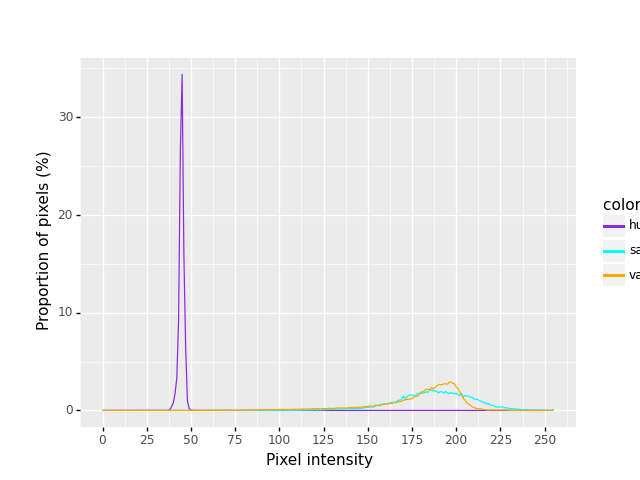

In [18]:
# Measure the color properties of the plant
color_hist = pcv.analyze_color(rgb_img=img, mask=mask, colorspaces="hsv")

![HSV color model](https://upload.wikimedia.org/wikipedia/commons/thumb/a/a0/Hsl-hsv_models.svg/600px-Hsl-hsv_models.svg.png)

In [19]:
# Output measurements
print(f"Hue circular mean = {pcv.outputs.observations['default']['hue_circular_mean']['value']} degrees")
print(f"Hue circular mean standard deviation = {pcv.outputs.observations['default']['hue_circular_std']['value']} degrees")
print(f"Hue median = {pcv.outputs.observations['default']['hue_median']['value']} degrees")

Hue circular mean = 89.2846045837206 degrees
Hue circular mean standard deviation = 2.8190857638934514 degrees
Hue median = 90.0 degrees
